### Time Series Clustering
The main difficulty of this project is the large abundance of time series. Each district of the city is represented by its own time series. Building a model and selecting hyperparameters for each individual series is a very time-consuming operation and also requires a lot of computing resources. The optimal solution - time series clustering

For example, during clustering, we can select six clusters and train six models (one model for each cluster)

Next, we only need to determine whether a series belongs to a cluster and make a prediction as an appropriate model for this cluster

In general, time series clustering can be divided into 2 types:
- **Feature-Based approach**: we try to extract everything from the signal/time series (feature extraction)
- **Raw data-Based approach**: directly applied to time series vectors without any spatial transformations

We will use the **Raw-data Based approach**

It should also be taken into account that using the *Raw-data Based approach* we will have as many features as there are observations in the time series. Therefore, we will be clustering in a very high dimensional space and will most likely encounter a problem known as the **Curse of Dimensionality**, due to which the resulting clusters can be very bad in shape, mix up, in order to prevent this we will need to use ** dimensionality reduction methods**

For time series clustering, we can use well-known clustering methods (K-Means, HAC, DBSCAN...)

### Clustering Methods
We will focus on the following clustering methods:
- `K-Means/TimeSeriesKMeans`: (`ts_learn` library)
- `Hierarchical Agglomerative Clustering`
- `DBSCAN`


### Feature Extraction
When using `K-Means` clustering, it is better to use the **Feature-Based approach**. We extract a bunch of features from the series and hope that they will describe the time series well, and we will perform clustering on the resulting features

When using `Dynamic Time Warping Matching`, the **Feature-Based** approach is not suitable, since we are trying to determine a measure of the similarity of the series (how they overlap). For `DTW`, downsampling the series using `resampling` (i.e. changing the frequency of the series) can be a good solution. For example, instead of minute observations/ticks, take 5/10/15 minute ones. The main thing to consider is that the main patterns (peaks, fluctuations) fall into this interval. This way we can keep the series structure, make it shorter and therefore much faster to identify similar series with `DTW`

**If the time series is a signal** (ECG, data from various devices), then the best way to extract features would be methods from the `signal processing` area. This is the Fourier transform for finding different frequencies, spectrograms and wavelet transforms

If the series is noisy, then it would be nice to smooth it first (various smoothings) so as not to find false patterns

There are libraries for extracting features from time series, such as `ts_fresh` or `ts_fel`


### Dimensionality Downscaling Methods
To reduce the dimension of time series, we will use:
- `PCA`
-`t-SNE`
- `MDS (MultiDimensional Scaling)`

You can also use `Time Series Embeddings` - train a neural network, usually an encoder/decoder. Input - **time series of arbitrary length**, output - compressed representation of the time series **fixed length (embeddings)**. Works very well in practice


### Clustering Distance and Quality Metrics
All these algorithms are tied to a certain distance metric. It is necessary to clearly understand how we measure the similarity of time series or determine pairwise differences between observations in the series. We will use:
- `Euclidean Distance`
- `DTW (Dynamic Time Warping Matching)`

To assess the quality of clustering, we will use:
- `Inertia`
- `Silhouette Coefficient`

**Inertia** shows how close/far the cluster objects are clustered around their centroid. A good model has a low **Inertian** and has a small number of clusters. To determine the optimal number K, we will use **Elbow Method**

The **Silhouette Coefficient** shows how tightly the objects are grouped in clusters and how well the clusters are separated from each other. The calculation uses the average intracluster distance (a) and the average distance to the nearest cluster (b). Silhouette is calculated for each sample object, then the final value is averaged over all sample objects

Takes values from [-1, 1]:
- `~-1`: bad sparse clustering
- `~0`: clusters intersect and overlap each other
- `~1`: dense and well-defined clusters

### Time Series Scaling
For correct clustering, it is necessary that all series have the same scale. For example, the values of one series may differ by tens or even hundreds of times from the values of another one. Determining the similarity of such a series will be very problematic, and we will get biased results. To this end, we will scale all the series using `StandardScaler`

It should also be taken into account that the series may differ from each other in time, for example, the series appeared recently (new product, promotion ...). We may not know some maximum and minimum values, more precisely, the observed maximum / minimum values may change over time

**Each time series must be scaled independently of the others**

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tslearn.clustering import TimeSeriesKMeans
from tslearn.barycenters import dtw_barycenter_averaging

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples

from sklearn.decomposition import PCA 
from sklearn.manifold import TSNE, MDS

from tqdm.autonotebook import tqdm
import warnings
import os

from src.plots import *
from src.model_clustering import *

sns.set_style("darkgrid")
warnings.filterwarnings('ignore')

In [2]:
# Data Reading 
DATA_SOURCE = 'D:\AI-Projects\Machine_Learning\ENG\TLC_NY_Trip_Demand_Prediction\processed_data'
SEED=23
os.chdir(DATA_SOURCE)

data = pd.read_csv('processed_ts_main.csv', parse_dates=['tpep_pickup_datetime'])
data

,tpep_pickup_datetime,PULocationID,n_trips
0,2020-01-01 00:00:00,4,10
1,2020-01-01 00:00:00,189,1
2,2020-01-01 00:00:00,186,26
3,2020-01-01 00:00:00,185,1
4,2020-01-01 00:00:00,181,7
...,...,...,...
3620587,2021-07-31 23:00:00,135,0
3620588,2021-07-31 23:00:00,134,0
3620589,2021-07-31 23:00:00,133,0
3620590,2021-07-31 23:00:00,219,0


We excluded series consisting only of zero values (103 and 104)

We also **have data on the average number of trips per hour for a particular month**

In [3]:
# Monthly data on the average number of trips per hour 
mean_trips_df = pd.read_csv('processed_ts_monthly.csv', parse_dates=['date'])
mean_trips_df

,PULocationID,mean_n_trips,date
0,1,0.0,2020-01-01 00:00:00
1,168,1.0,2020-01-01 00:00:00
2,169,0.0,2020-01-01 00:00:00
3,170,56.0,2020-01-01 00:00:00
4,171,0.0,2020-01-01 00:00:00
...,...,...,...
119011,94,0.0,2021-07-01 23:00:00
119012,95,0.0,2021-07-01 23:00:00
119013,96,0.0,2021-07-01 23:00:00
119014,82,0.0,2021-07-01 23:00:00


For better clustering, we will remove series in which the average number of trips per month for the entire period doesn't exceed 12

In [4]:
# Select "bad" districts
bad_districts = []

# We set the thresh to 12 trips (i.e. at least the average amount of trips for the entire period per month should be more than 12)
for district in set(mean_trips_df['PULocationID']):
    if mean_trips_df[mean_trips_df['PULocationID'] == district]['mean_n_trips'].sum() < 12:
        bad_districts.append(district)
        
print('Districts Remained: ', 263-len(bad_districts)-2)

Districts Remained:  100


In [5]:
# Exclude noisy series 
data = data[~data['PULocationID'].isin(bad_districts)]

### Prepare Train/Test
The main purpose of clustering is to highlight the target series in the cluster. We will test the quality of the final solution on absolutely new series. Eliminate 5 random series from the data

In [6]:
# Select 5 random series from the data  
test_districts = data['PULocationID'].sample(5, random_state=SEED).values

# Test Series 
test_serieses = data[data['PULocationID'].isin(test_districts)]

# Exclude Test Series from Train 
train_serieses = data[~data['PULocationID'].isin(test_districts)]

We will train the model on data for the period `2020-01-01 00:00:00 - 2021-01-31 23:00:00`

Test in February 2021 (monthly forecast)

In [7]:
# Split a series according to a time interval
def split_series(ts, date_start, date_end, freq):
    dt_start = pd.to_datetime(date_start)
    dt_end = pd.to_datetime(date_end)
    target_dates = pd.date_range(dt_start, dt_end, freq=freq)
    result = ts[ts['tpep_pickup_datetime'].isin(target_dates)].sort_values(by='tpep_pickup_datetime')
    return result

In [8]:
# Data for clustering and obtaining target series
train_data = split_series(train_serieses,
                          date_start='2020-01-01 00:00:00',
                          date_end='2021-01-31 23:00:00', 
                          freq='h')

# Series to be clustered
cluster_serieses = split_series(test_serieses,
                                date_start='2020-01-01 00:00:00',
                                date_end='2021-01-31 23:00:00', 
                                freq='h')

# Inference for clustered series 
inference_data = split_series(test_serieses,
                              date_start='2020-02-01 00:00:00',
                              date_end='2021-02-28 23:00:00',
                              freq='h')

In [59]:
# Save the data
train_data.to_csv('train_data.csv', index=False)
cluster_serieses.to_csv('cluster_serieses.csv', index=False)
inference_data.to_csv('inference_data.csv', index=False)

In [9]:
# Revrite the name for convinience
df_train = train_data

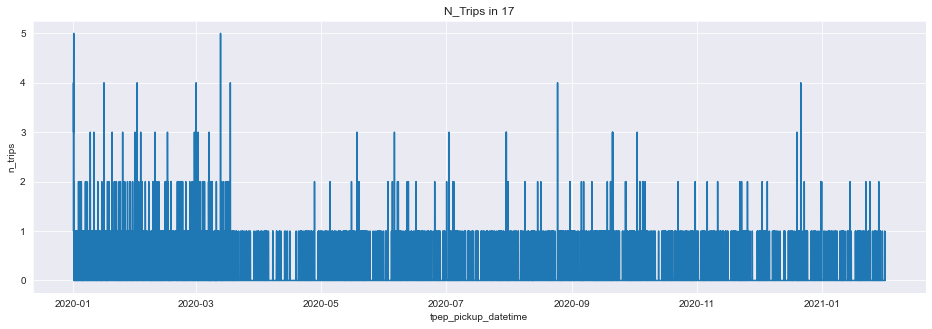

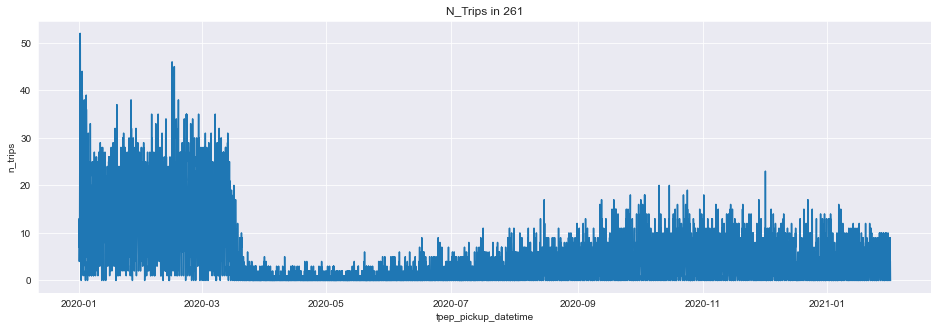

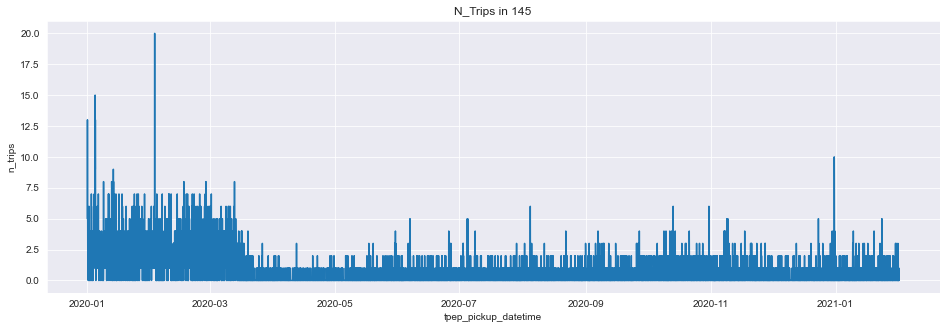

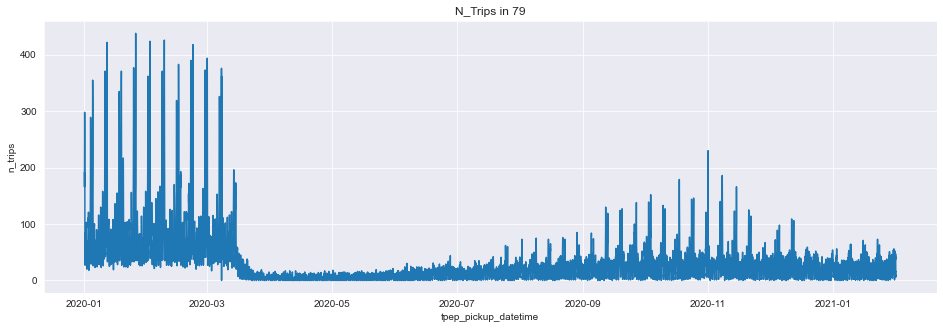

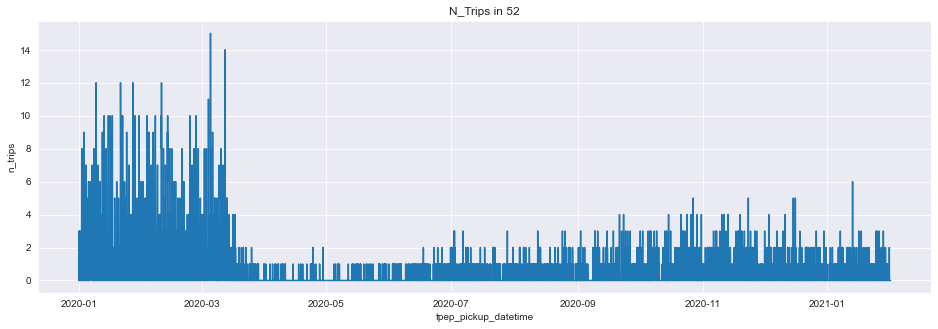

In [14]:
# Let's have a look at 5 random series
rand_districts = np.random.choice(df_train['PULocationID'].unique(), 5)
for district in rand_districts:
    plot_series(df_train.query(f'PULocationID == {district}'), city_zone=district)

The selected series look good, have trends, seasonality

Most importantly, we have eliminated (almost all) series with poor/missing structure (noise: series with a low number of trips)

In [15]:
# Change the appearance of the table (Columns - observations in the time series)
series_df = df_train.pivot(index='PULocationID', columns='tpep_pickup_datetime', values='n_trips').reset_index()

# Series Scaling (each series scales independently)
scaler = StandardScaler()

# The first time we transpose to scale each series independently (the column describes the district series)
# second time - return the scaled ticks of the series as features
scaled_ts = scaler.fit_transform(series_df.iloc[:, 1:].T).T 

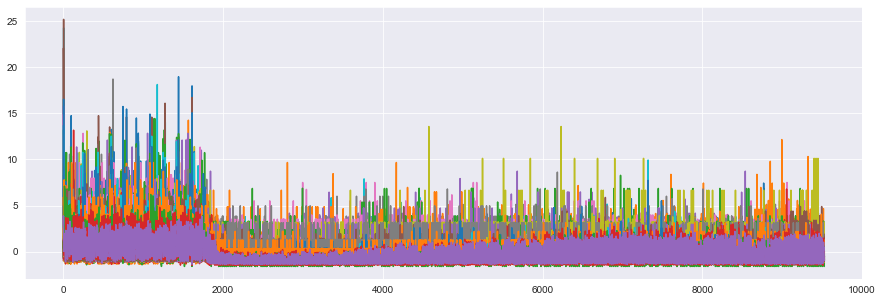

In [16]:
# let's look at series 
plt.figure(figsize=(15, 5))
plt.plot(scaled_ts.T)
plt.grid(True);

It is difficult to make sense of this picture, so let's move on to clustering

### Baseline TimeSeriesK-Means
Let's build a simple clustering using K-Means from the `ts_learn` library.

The optimal number of clusters is determined by enumeration using **Silhouette Coefficient and Inertia (Elbow Method)**

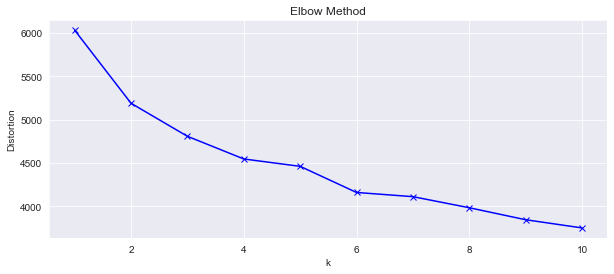

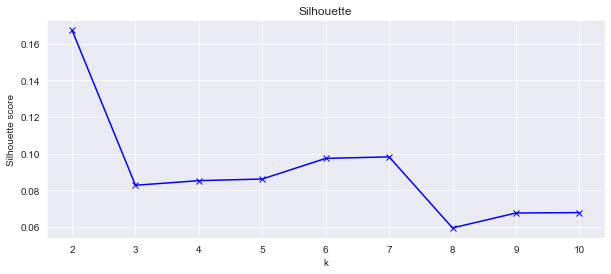

In [18]:
get_kmeans_results(data=scaled_ts, max_clusters=10, metric='euclidean', seed=SEED)

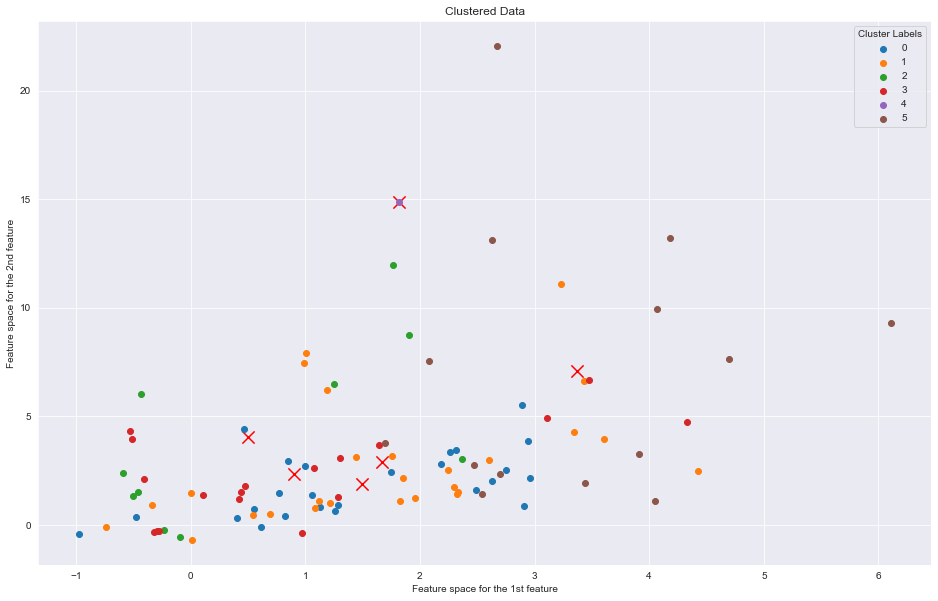

In [20]:
# Let's look at the shape of the resulting clusters
model = TimeSeriesKMeans(n_clusters=6, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=scaled_ts,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

The resulting clusters intersect and overlap each other, the centroids are also very close, and the metric value
`Silhouette Coefficient = 0.10`. For better clustering, we can experiment:
- Another Algorithm
- Other Metric
- Lowering the Dimension of the Series

### Time Series Dimension Reduction Methods

### PCA

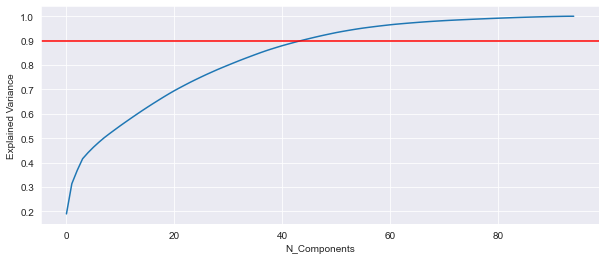

In [21]:
# It is necessary to determine the number of principal components explaining most of the variance
pca = PCA(random_state=SEED)
pca.fit(scaled_ts)
exp_var_array = np.cumsum(pca.explained_variance_ratio_)

# Visualize
plt.figure(figsize=(10,4))
plt.plot(exp_var_array)
plt.xlabel('N_Components')
plt.ylabel('Explained Variance')
plt.axhline(0.9, c='r');

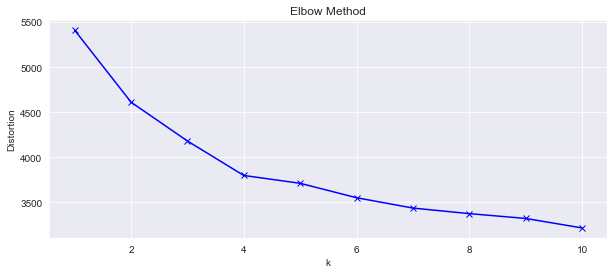

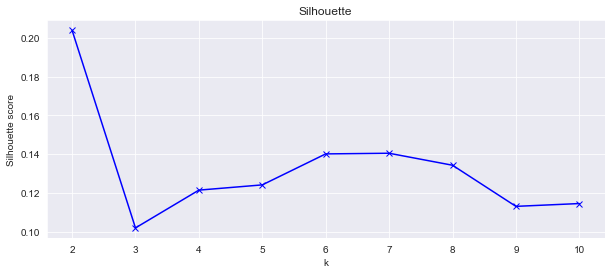

In [23]:
# Determine the required number of components
n_components = int(np.argwhere(exp_var_array > 0.9)[0])

pca = PCA(n_components=n_components, random_state=SEED)
data_pca = pca.fit_transform(scaled_ts)

# Clustering on reduced dimension features
get_kmeans_results(data=data_pca, max_clusters=10, metric='euclidean', seed=SEED)

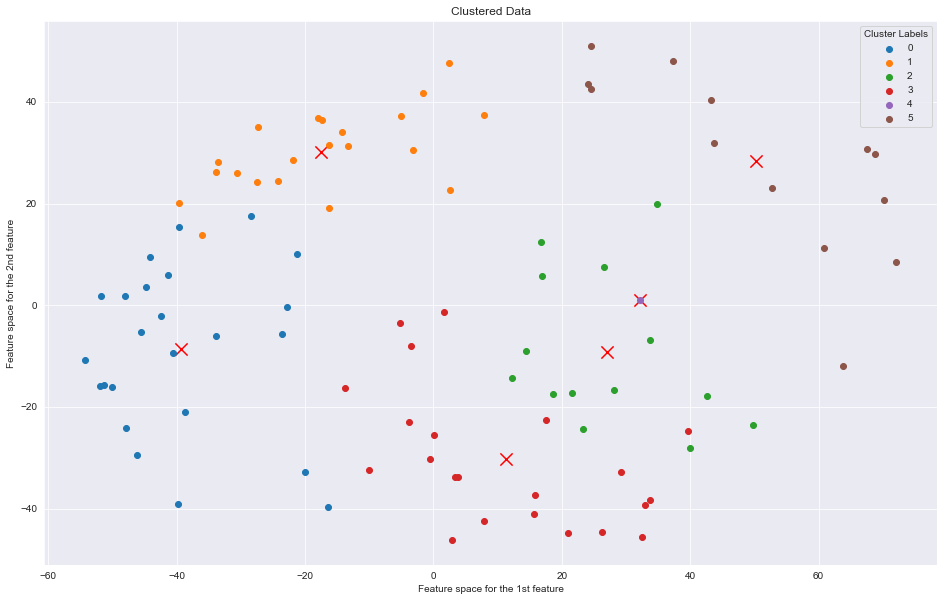

In [24]:
model = TimeSeriesKMeans(n_clusters=6, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=data_pca,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

Clustering quality increased slightly `Silhouette Coefficient = 0.14`. Clusters overlap a little

### t-SNE

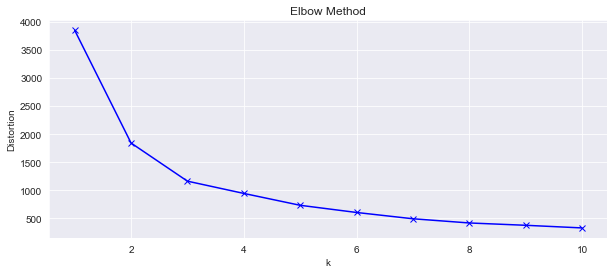

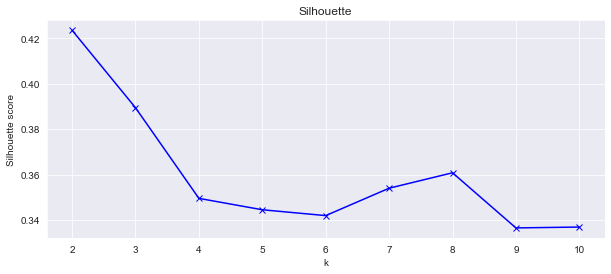

In [25]:
# Obtain features in two-dimensional space
tsne = TSNE(n_components=2, init='pca', random_state=SEED)
data_tsne = tsne.fit_transform(scaled_ts)

get_kmeans_results(data=data_tsne, max_clusters=10, metric='euclidean', seed=SEED)

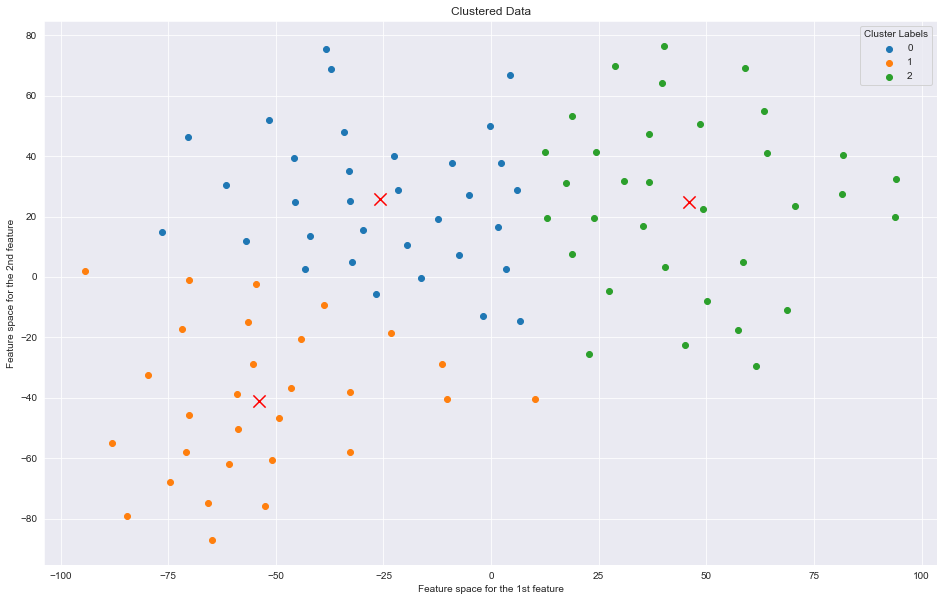

In [26]:
model = TimeSeriesKMeans(n_clusters=3, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=data_tsne,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

Clusters no longer intersect and separate. Metric `Silhouette = 0.39`

### Multidimensional Scaling (MDS)

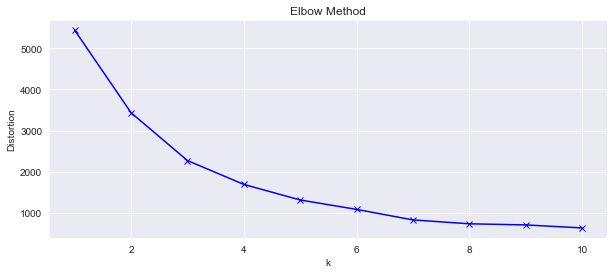

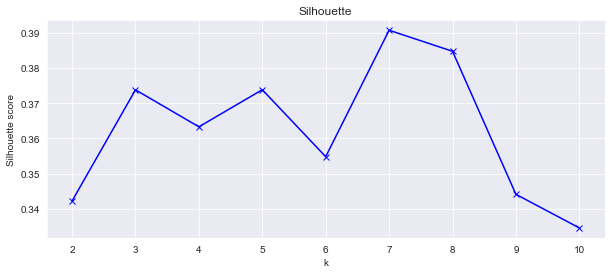

In [27]:
mds = MDS(n_components=2, n_init=3, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(scaled_ts) 

get_kmeans_results(data=data_mds, max_clusters=10, metric='euclidean', seed=SEED)

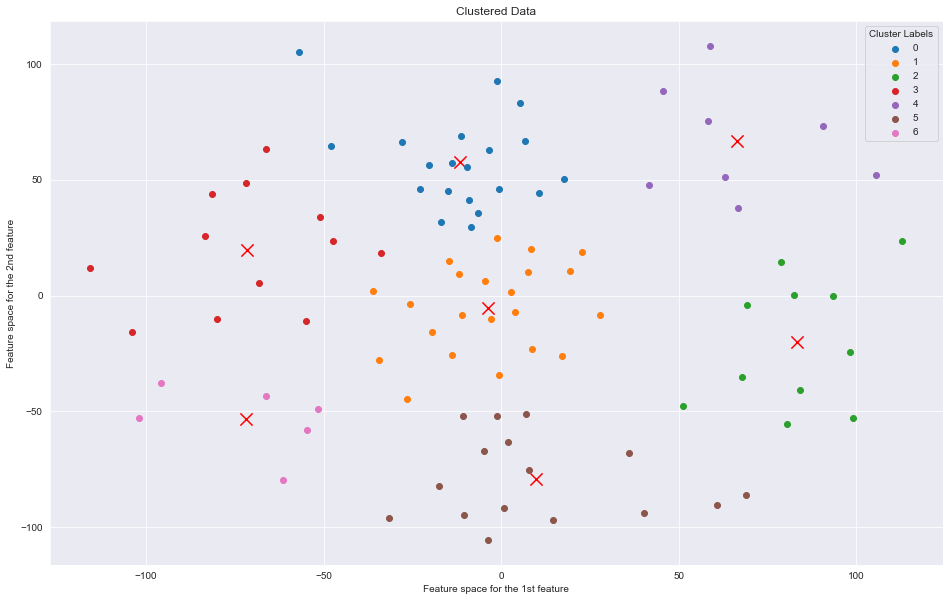

In [28]:
model = TimeSeriesKMeans(n_clusters=7, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=data_mds,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

Also good clustering, `Silhouette value: 0.39`

**MDS and t-SNE** give good results. We can choose any of them. Let's take a look at the results of clustering in more detail and make a decision

In [29]:
# Train TimeSeriesKMeans с t-SNE
kmeans_model = TimeSeriesKMeans(n_clusters=3, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)
cluster_labels = kmeans_model.fit_predict(data_tsne)

ts_clustered = [ scaled_ts[(cluster_labels == lable), :] for lable in np.unique(cluster_labels)]

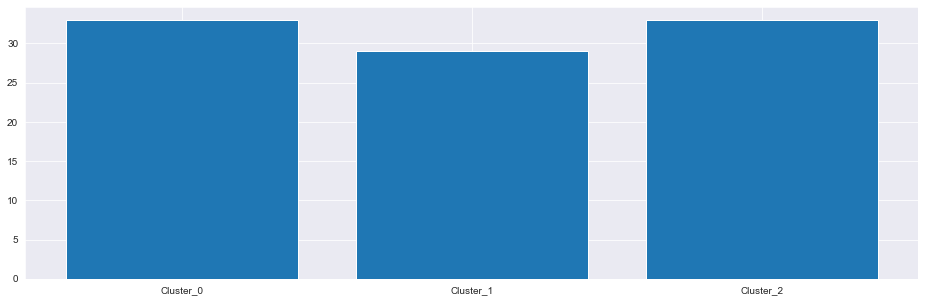

In [30]:
# Objects distribution in clusters
labels = [f'Cluster_{i}' for i in range(len(ts_clustered))]
samples_in_cluster = [val.shape[0] for val in ts_clustered]

plt.figure(figsize=(16,5))
plt.bar(labels, samples_in_cluster);

The distribution of objects in the clusters is more or less uniform

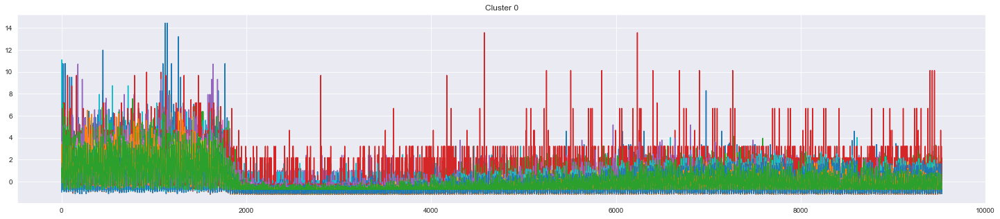

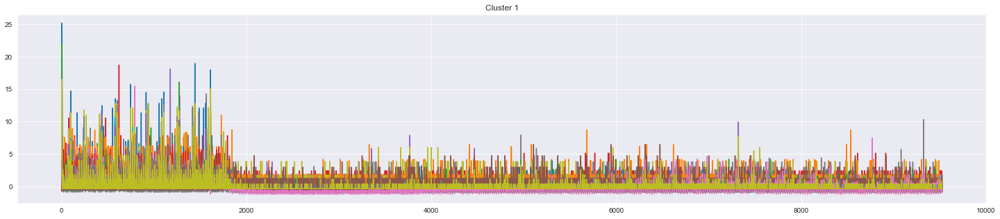

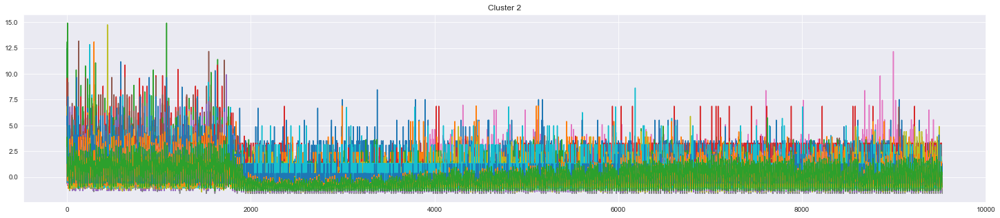

In [31]:
# Let's take a look at the series in clusters
n_clusters = len(np.unique(cluster_labels))
for i in range(0, n_clusters):
    plt.figure(figsize=(25, 5))
    plt.title(f'Cluster {i}')
    plt.plot(ts_clustered[i].T)
    plt.grid(True);

==========Cluster number: 0==========


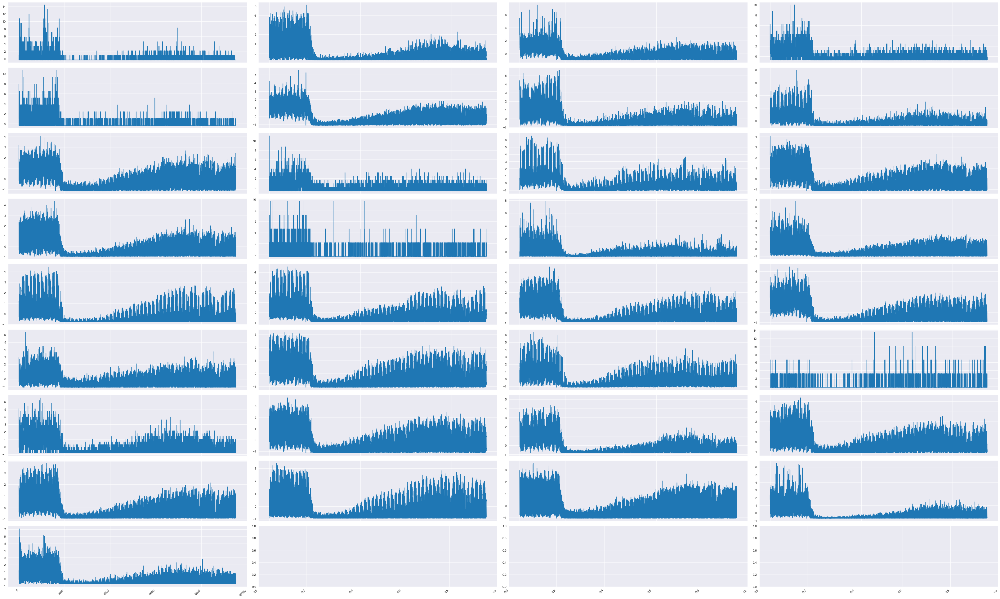

==========Cluster number: 1==========


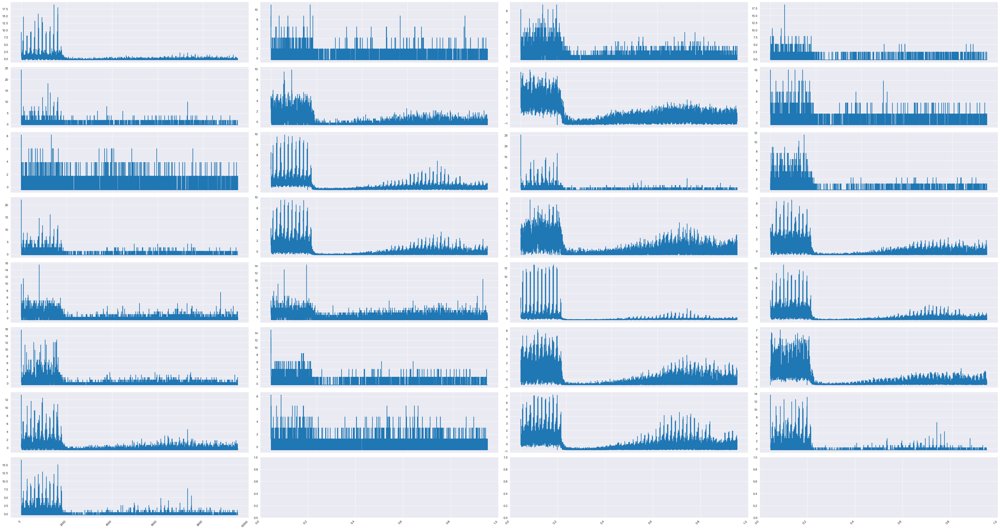

==========Cluster number: 2==========


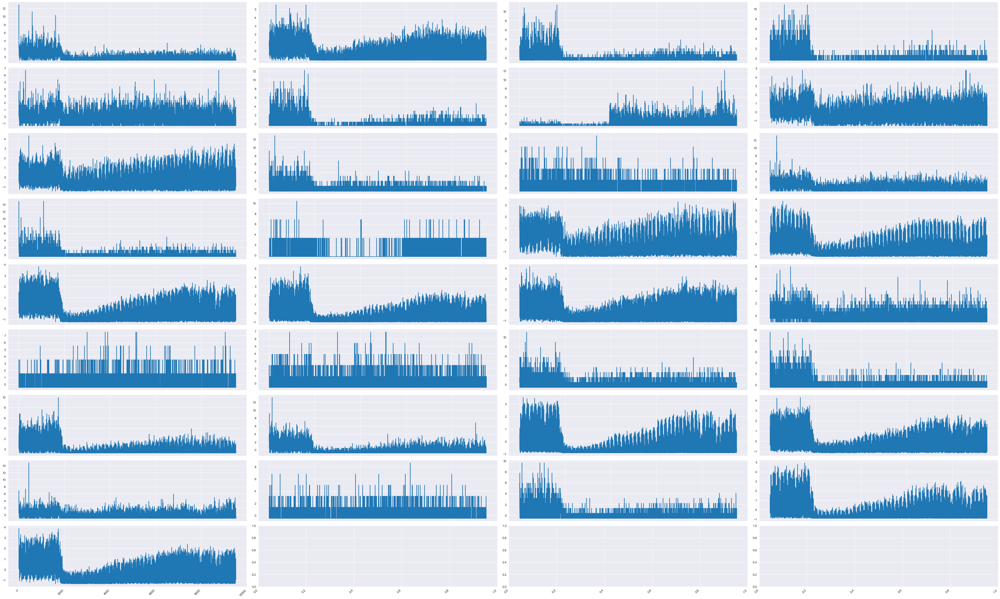

In [32]:
for cluster in range(len(ts_clustered)):
    print(f"==========Cluster number: {cluster}==========")
    plot_cluster_ts(ts_clustered[cluster])

In [33]:
# Train TimeSeriesKMeans с MDS
kmeans_model = TimeSeriesKMeans(n_clusters=7, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)
cluster_labels = kmeans_model.fit_predict(data_mds)

ts_clustered = [ scaled_ts[(cluster_labels == lable), :] for lable in np.unique(cluster_labels)]

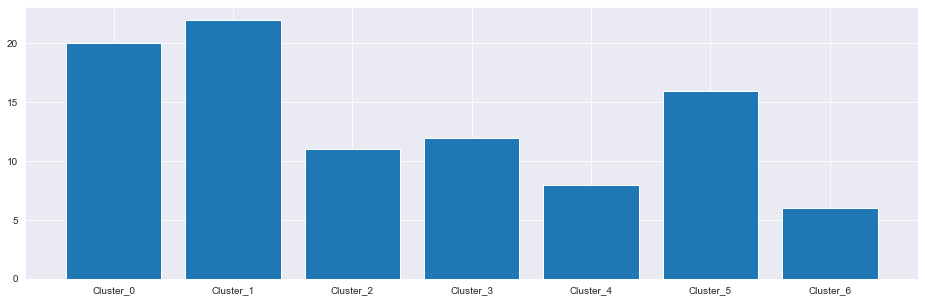

In [34]:
# Objects distribution in clusters
labels = [f'Cluster_{i}' for i in range(len(ts_clustered))]
samples_in_cluster = [val.shape[0] for val in ts_clustered]

plt.figure(figsize=(16,5))
plt.bar(labels, samples_in_cluster);

==========Cluster number: 0==========


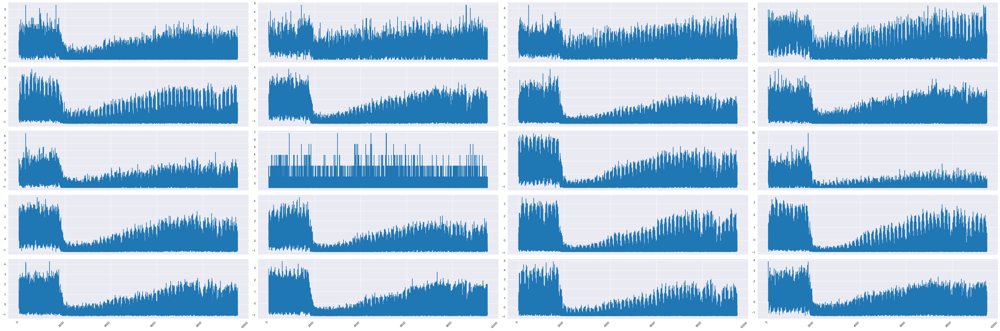

==========Cluster number: 1==========


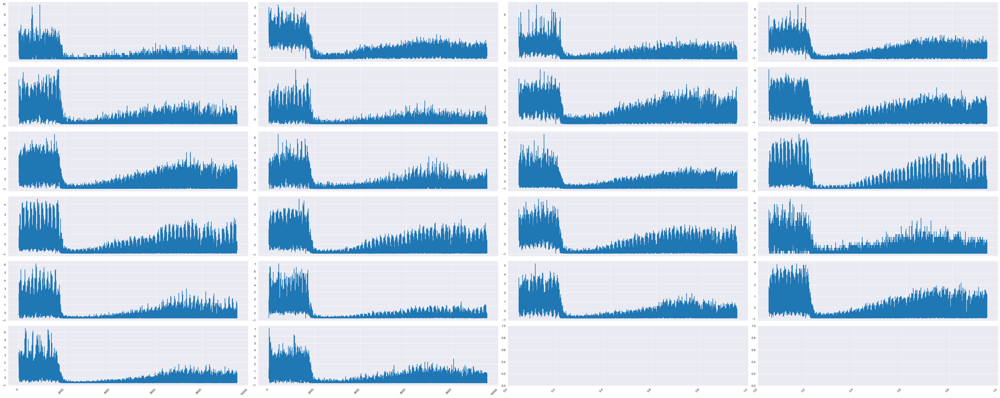

==========Cluster number: 2==========


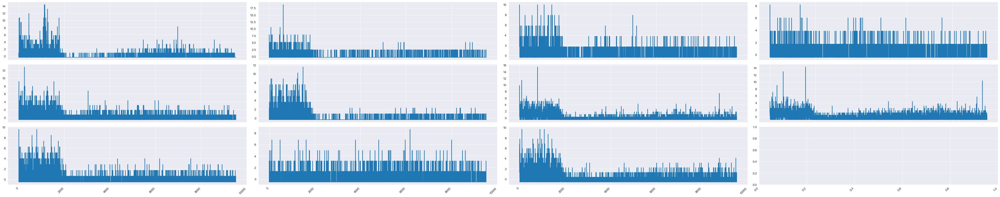

==========Cluster number: 3==========


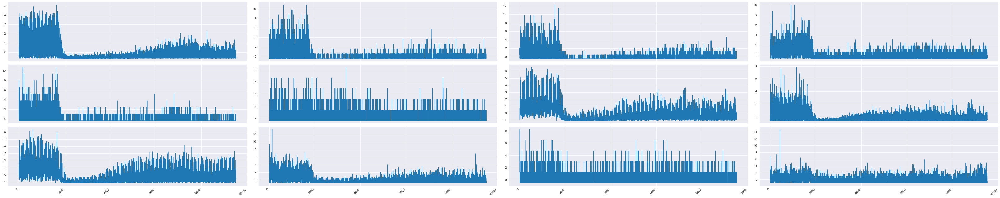

==========Cluster number: 4==========


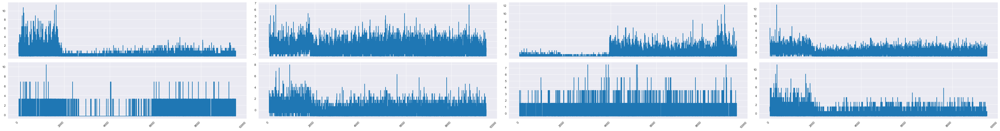

==========Cluster number: 5==========


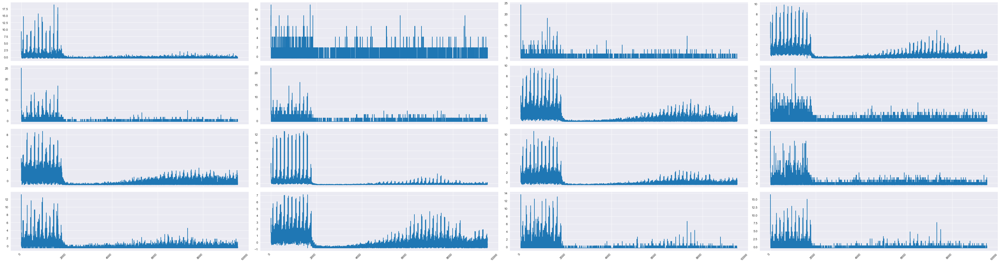

==========Cluster number: 6==========


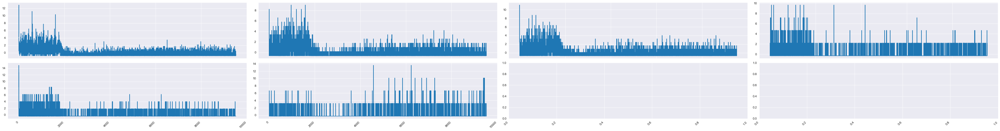

In [35]:
for cluster in range(len(ts_clustered)):
    print(f"==========Cluster number: {cluster}==========")
    plot_cluster_ts(ts_clustered[cluster])

### Select Target Series
Next, we need to select the target series from the clusters. This can be done in several ways:
- Use the series closest to the centroid of its cluster
- Get new series as an average of all series in the cluster
- Use `dtw_barycenter_averaging: DBA`
- Use cluster centroids

In my opinion, the most unreliable way is to use the average series in the cluster (the problem with outliers, some peaks and dependencies disappear)

We will use the series closest to the cluster centroid

**Look at the features of MDS**

In [37]:
# Первый вариант (т.е. находим самый ближайший ряд к центру кластера)
closest_clusters_indxs = [np.argmin([numpy.linalg.norm(cluster_center - point, ord=2) for point in data_mds]) \
                                                                        for cluster_center in kmeans_model.cluster_centers_]

target_serieses = scaled_ts[closest_clusters_indxs, :]

### Target Series - Closest Series to Cluster Centroid

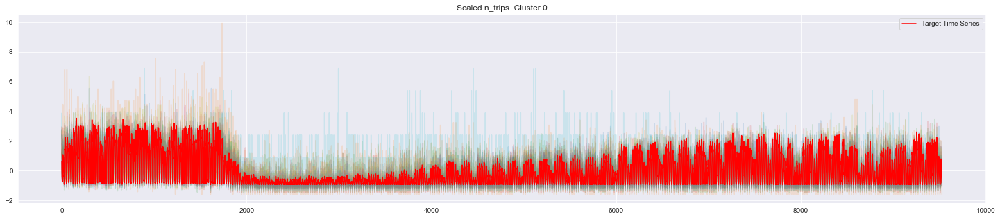

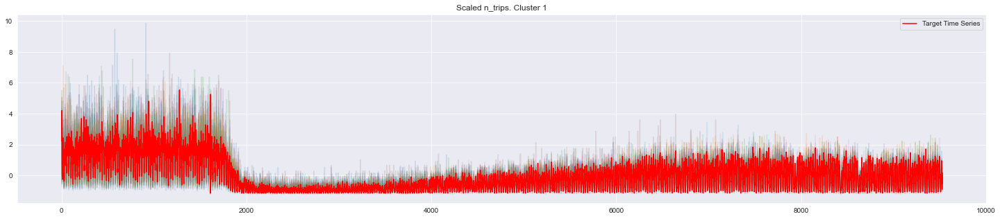

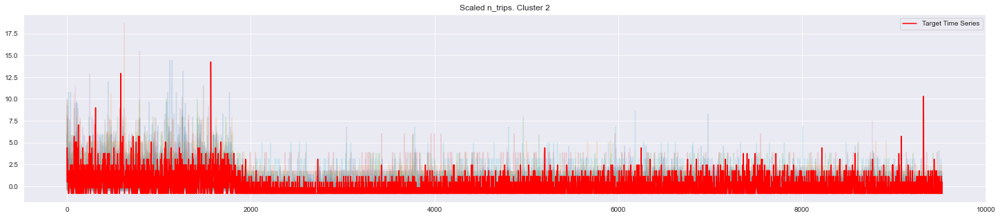

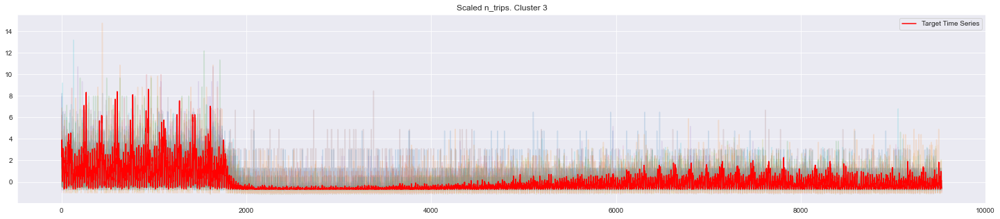

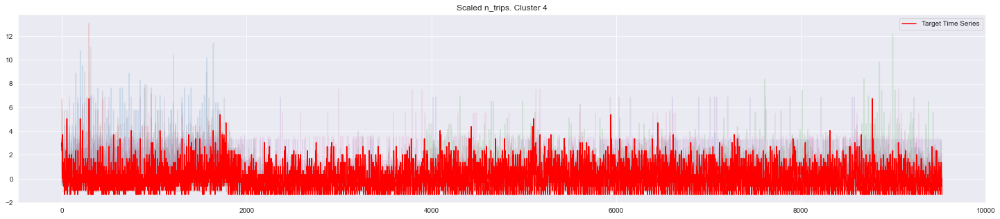

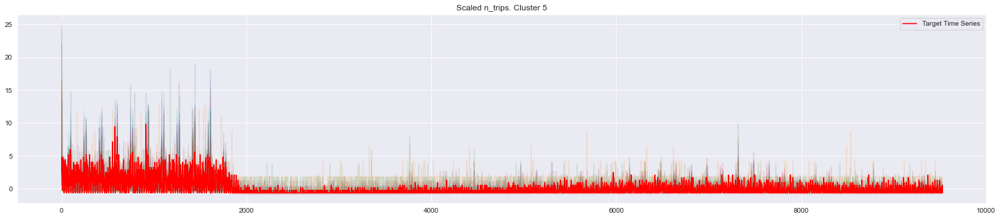

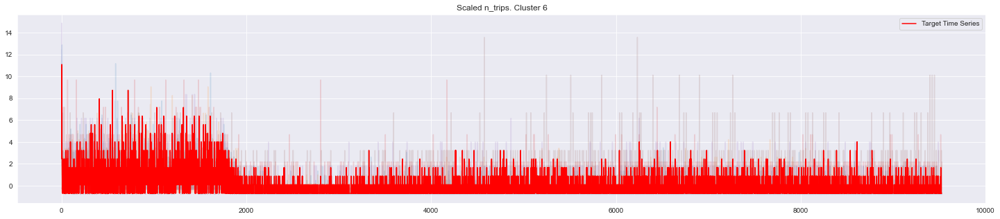

In [38]:
# Visualize
for indx, series in enumerate(target_serieses):
    plt.figure(figsize=(25, 5))
    plt.plot(ts_clustered[indx].T,  alpha = 0.15)
    plt.plot(series, c = 'r', label='Target Time Series')
    plt.title(f'Scaled n_trips. Cluster {indx}')
    plt.legend();

### Target Series - Average of Cluster Series

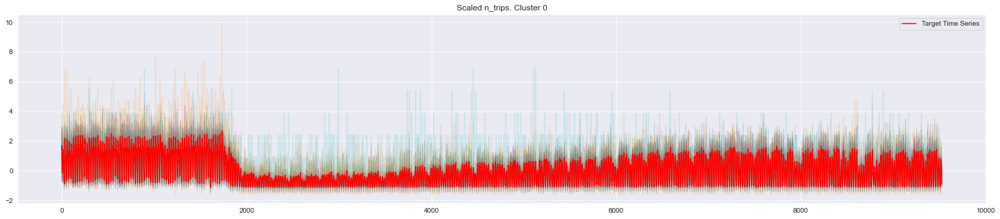

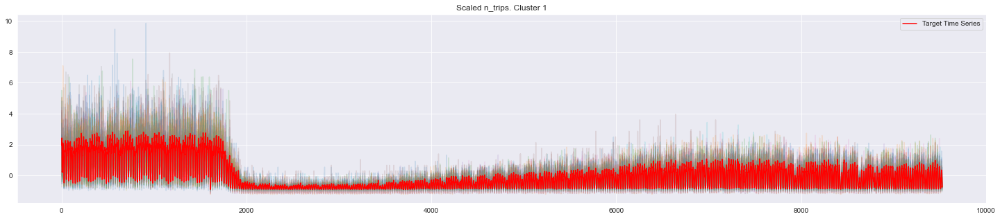

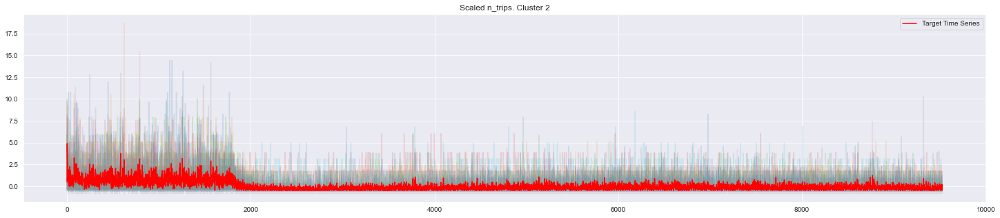

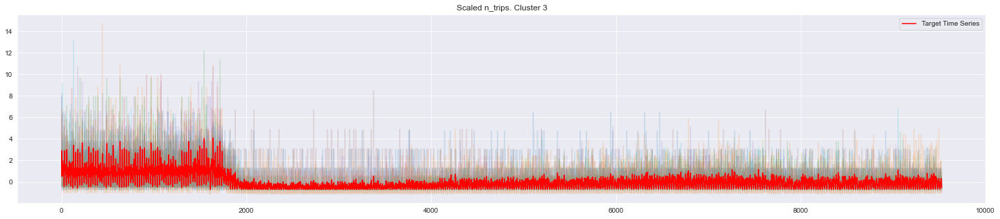

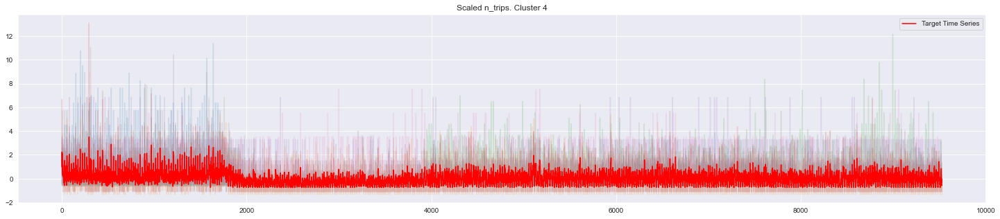

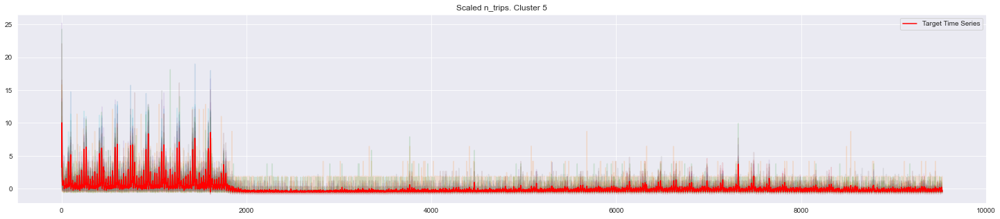

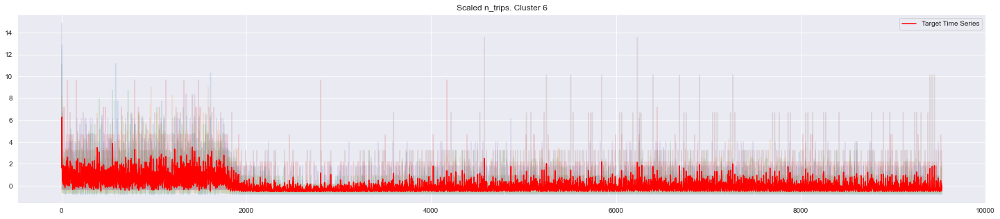

In [39]:
# Visualize
for i in range(len(ts_clustered)):
    plt.figure(figsize=(25, 5))
    plt.plot(ts_clustered[i].T,  alpha = 0.15)
    plt.plot(np.mean(ts_clustered[i], axis=0), c = 'r', label='Target Time Series')
    plt.title(f'Scaled n_trips. Cluster {i}')
    plt.legend();

### DBA
Obtaining a Target Series using the DBA Algorithm
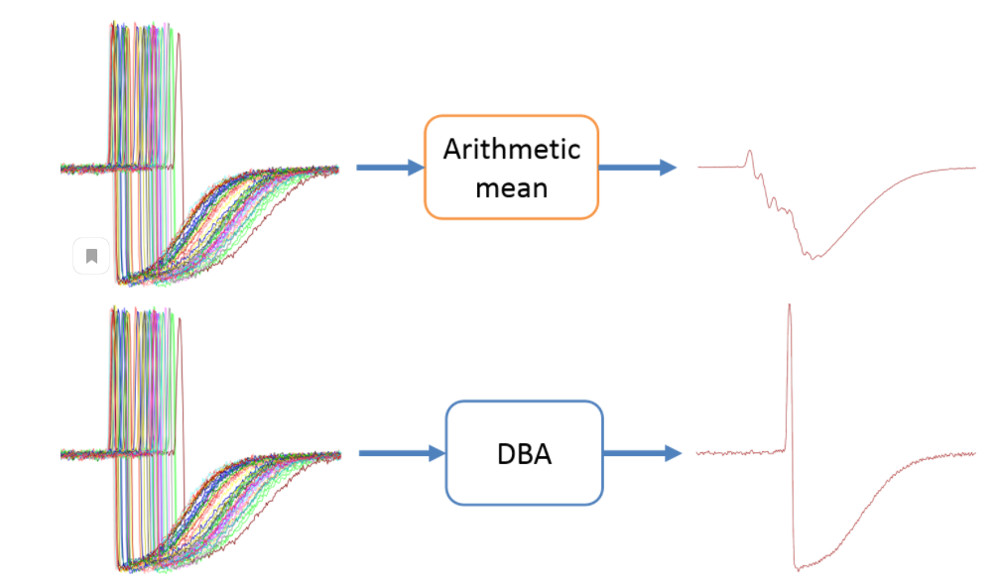

In [151]:
target_serieses = [dtw_barycenter_averaging(cluster_serieses, max_iter=5, verbose=True) for cluster_serieses in ts_clustered]

Attempt 1
[DBA] epoch 1, cost: 1234.582
[DBA] epoch 2, cost: 1032.380
[DBA] epoch 3, cost: 988.984
[DBA] epoch 4, cost: 970.871
[DBA] epoch 5, cost: 962.456
Attempt 1
[DBA] epoch 1, cost: 983.878
[DBA] epoch 2, cost: 739.656
[DBA] epoch 3, cost: 694.663
[DBA] epoch 4, cost: 678.487
[DBA] epoch 5, cost: 670.342
Attempt 1
[DBA] epoch 1, cost: 4724.799
[DBA] epoch 2, cost: 2807.821
[DBA] epoch 3, cost: 2439.946
[DBA] epoch 4, cost: 2352.422
[DBA] epoch 5, cost: 2310.634
Attempt 1
[DBA] epoch 1, cost: 3335.211
[DBA] epoch 2, cost: 2398.229
[DBA] epoch 3, cost: 2176.999
[DBA] epoch 4, cost: 2106.516
[DBA] epoch 5, cost: 2078.158
Attempt 1
[DBA] epoch 1, cost: 4390.105
[DBA] epoch 2, cost: 3041.767
[DBA] epoch 3, cost: 2741.554
[DBA] epoch 4, cost: 2650.146
[DBA] epoch 5, cost: 2611.736
Attempt 1
[DBA] epoch 1, cost: 2401.420
[DBA] epoch 2, cost: 1804.742
[DBA] epoch 3, cost: 1680.946
[DBA] epoch 4, cost: 1643.248
[DBA] epoch 5, cost: 1625.535
Attempt 1
[DBA] epoch 1, cost: 4038.930
[DBA] ep

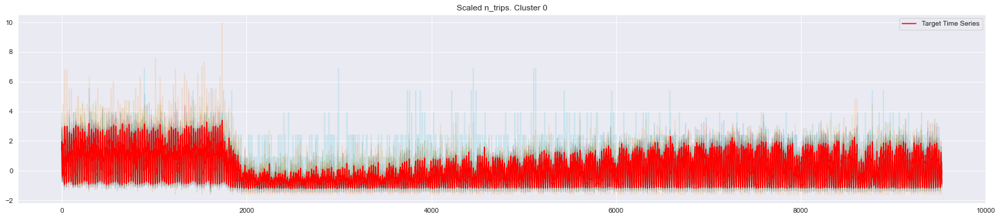

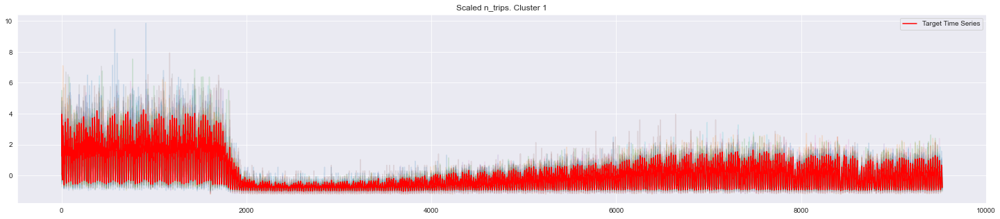

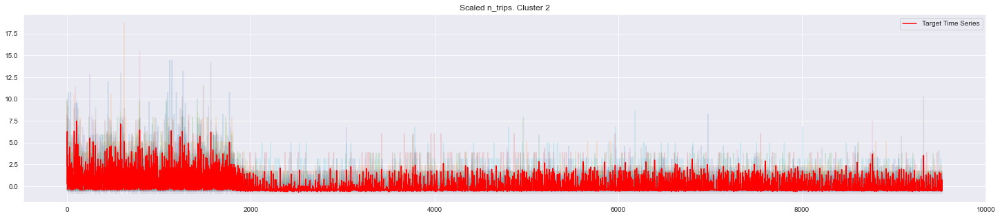

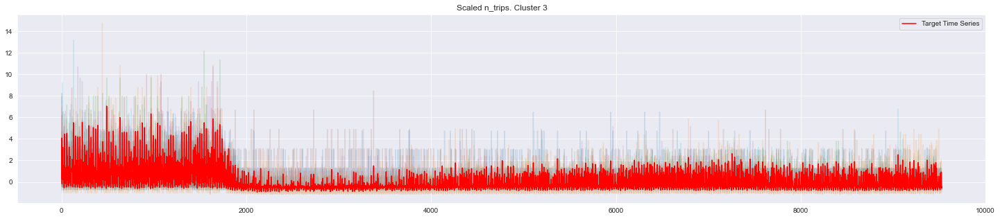

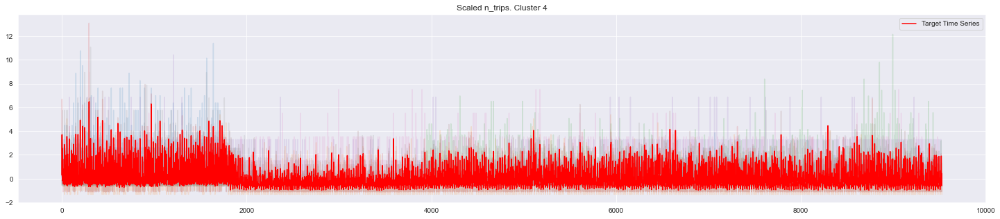

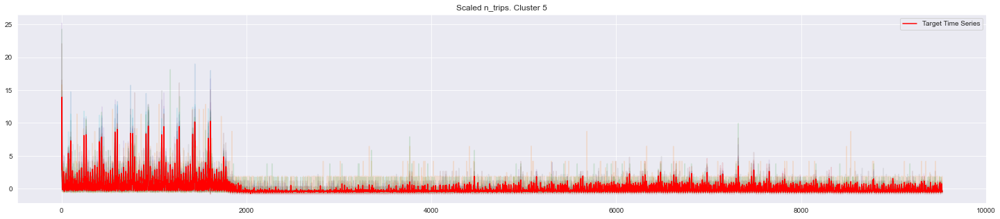

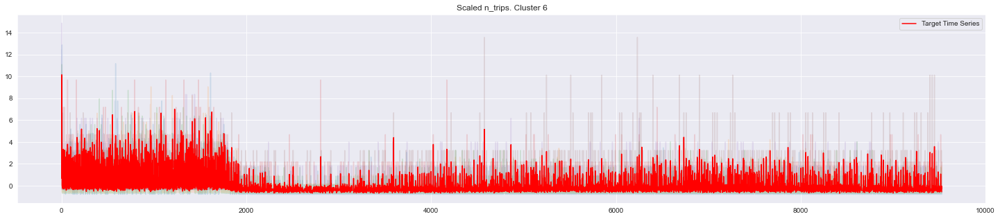

In [152]:
# Visualize
for indx, series in enumerate(target_serieses):
    plt.figure(figsize=(25, 5))
    plt.plot(ts_clustered[indx].T,  alpha = 0.15)
    plt.plot(series, c = 'r', label='Target Time Series')
    plt.title(f'Scaled n_trips. Cluster {indx}')
    plt.legend();

Using DBA results in a better result series. The first 5-10 epochs give the biggest drop in loss.

It can be seen that the series obtained using DBA have a lot in common with cluster centroids.

### AgglomerativeClustering (HAC)

In [40]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

In [41]:
# HAC clustering results
def get_hac_results(data, max_clusters=10, linkage='euclidean', seed=23):
    silhouette = []
    clusters_range = range(2, max_clusters+1)
    for K in tqdm(clusters_range):
        model = AgglomerativeClustering(n_clusters=K, linkage=linkage)
        model.fit(data)
        silhouette.append(silhouette_score(data, model.labels_))
        
    # Visualize
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette')
    plt.grid(True);

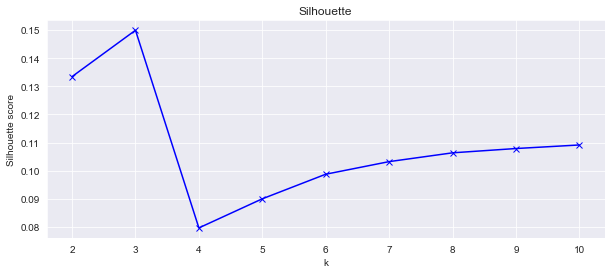

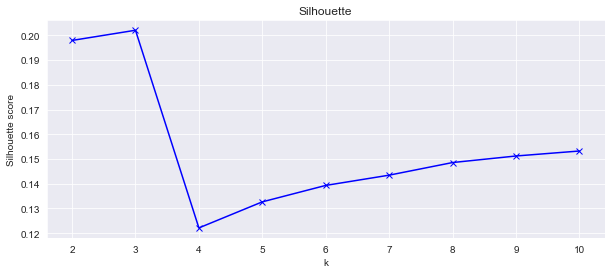

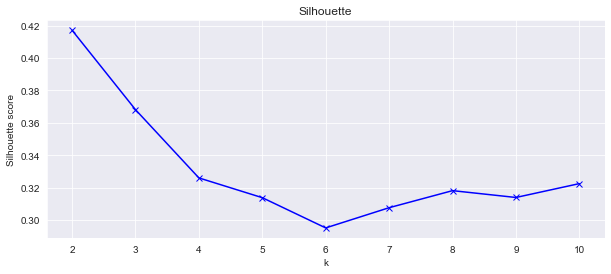

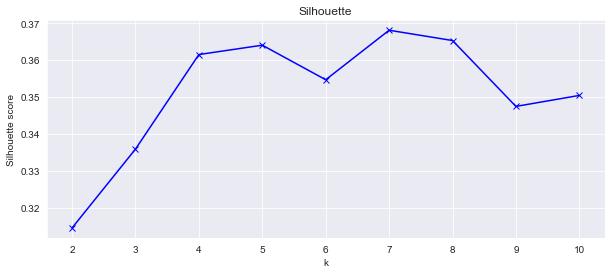

In [42]:
features = {'Original': scaled_ts,
            'PCA': data_pca,
            't-SNE': data_tsne,
            'MDS': data_mds}

for name, data in features.items():
    get_hac_results(data=data, max_clusters=10, linkage='ward', seed=SEED)

In [1]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

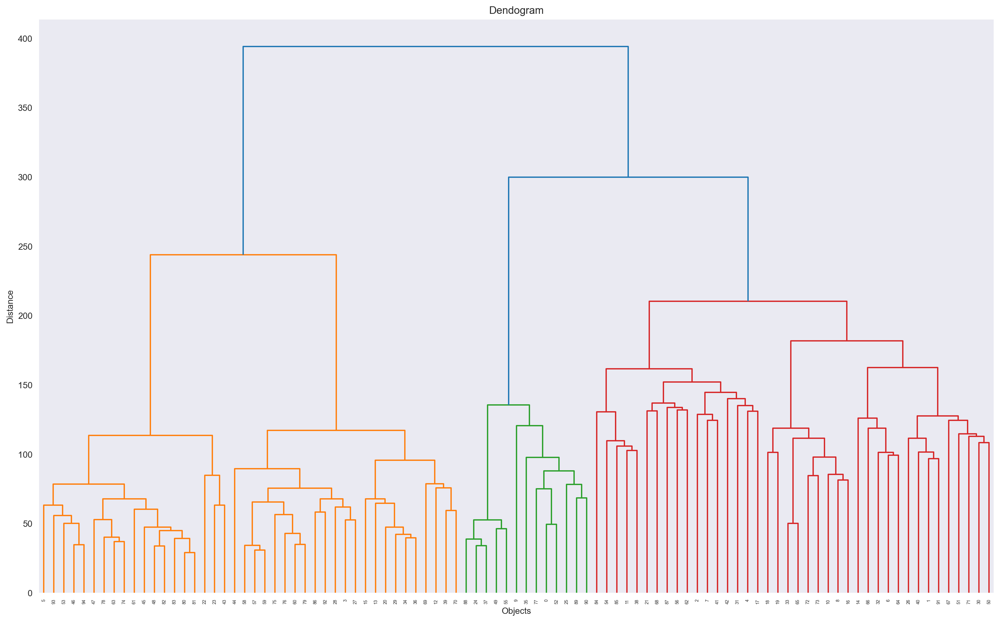

In [43]:
# Dendrogram
model = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean', compute_distances=True)

plot_dendrogram(data=features['Original'],
                model=model,
                color_threshold=260)

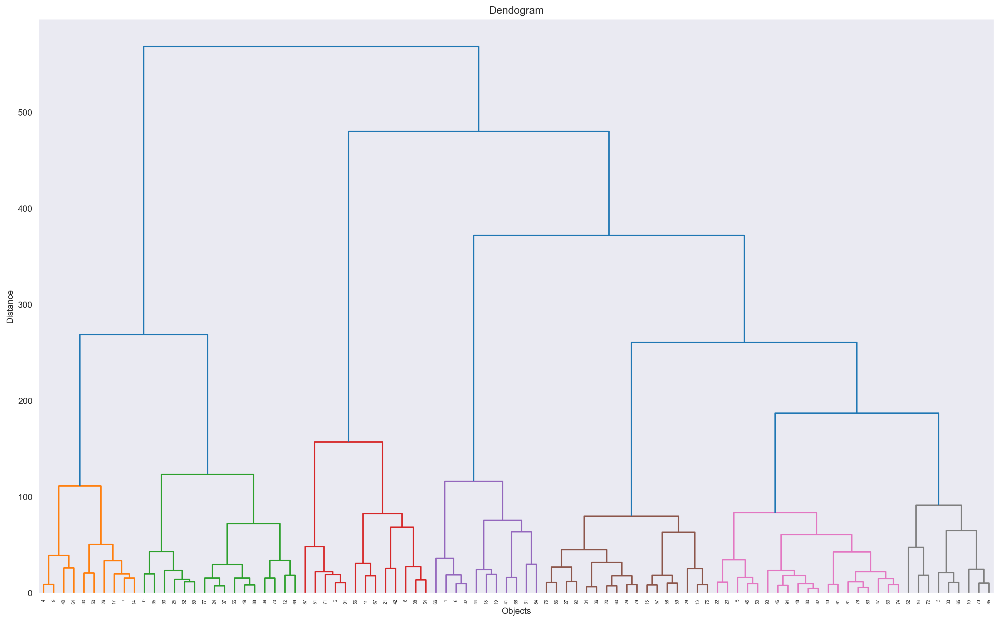

In [44]:
# Dendogram for downsized features (MDS)
model = AgglomerativeClustering(n_clusters=7, linkage='ward', affinity='euclidean', compute_distances=True)

plot_dendrogram(data=features['MDS'],
                model=model,
                color_threshold=180)

In [45]:
model = AgglomerativeClustering(n_clusters=7, linkage='ward', 
                                affinity='euclidean', compute_distances=True)

model.fit(data_mds)

AgglomerativeClustering(compute_distances=True, n_clusters=7)

In [46]:
# Cluster labels
cluster_labels = model.labels_
ts_clustered = [scaled_ts[(cluster_labels == label), :] for label in np.unique(model.labels_)]

==========Cluster number: 0==========


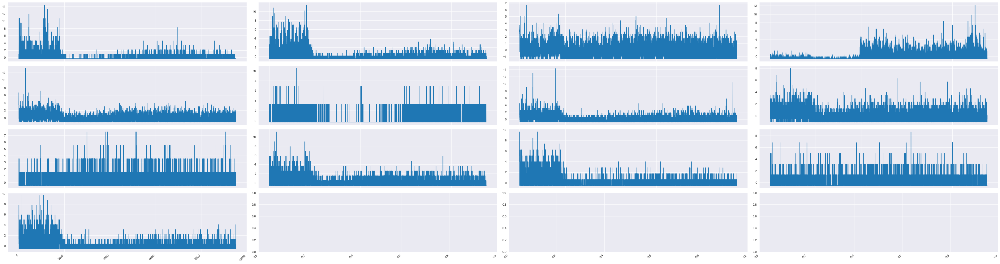

==========Cluster number: 1==========


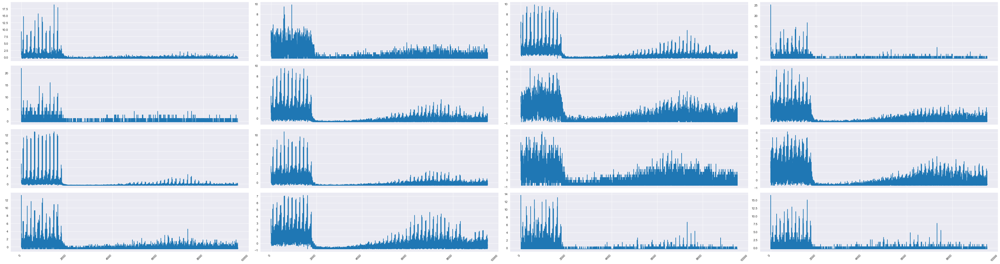

==========Cluster number: 2==========


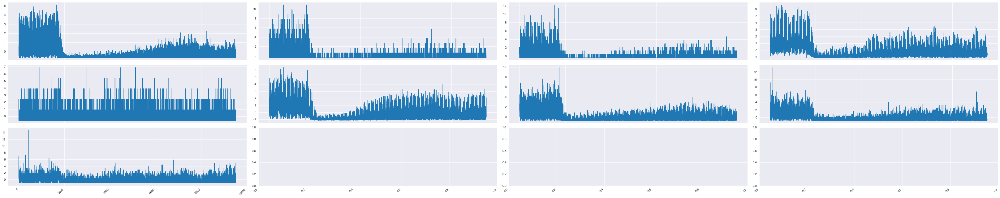

==========Cluster number: 3==========


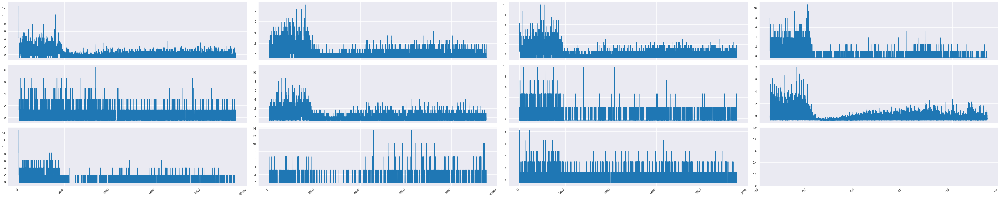

==========Cluster number: 4==========


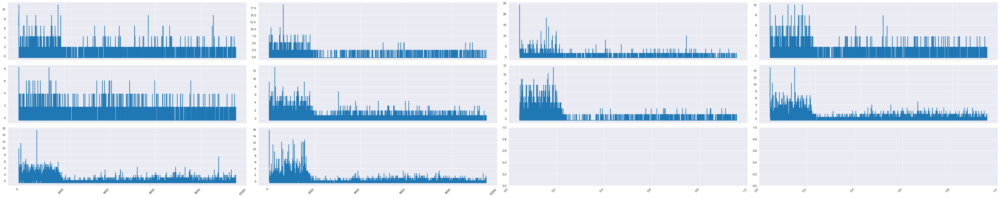

==========Cluster number: 5==========


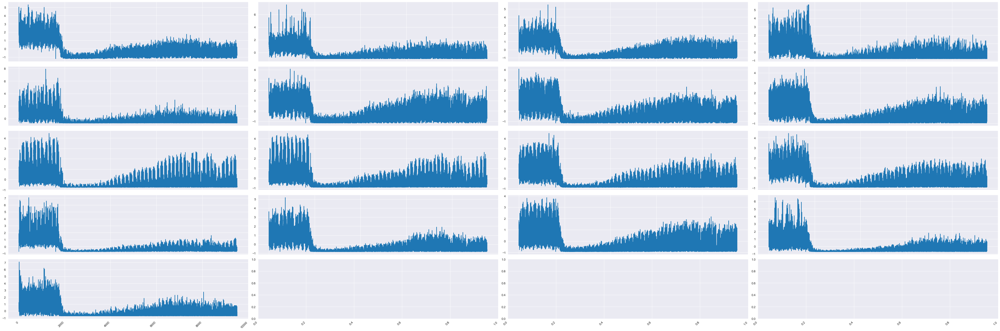

==========Cluster number: 6==========


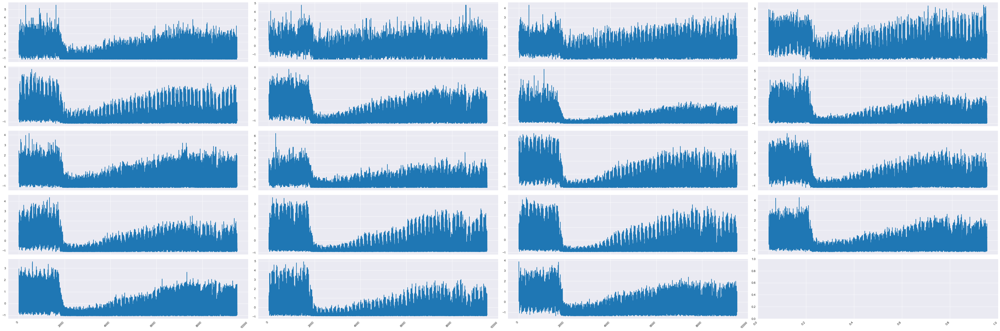

In [47]:
for cluster in range(len(ts_clustered)):
    print(f"==========Cluster number: {cluster}==========")
    plot_cluster_ts(ts_clustered[cluster])

Not bad, but results look better with KMeans

### DBSCAN

The main difficulty is the enumeration of the `eps and min_samples` parameters, given that we submit the original/reduced dimensionality features using various methods, it is necessary to select these parameters individually each time. This is very time consuming.

Best combination of `eps=1.2, min_samples=9` and `t-SNE`

To find the optimal eps, you can fix some min_samples and, sorting through the radius, evaluate the quality by metrics:
- Kalinsky-Kharabasha
- Davis-Buldin index

In [49]:
from sklearn.cluster import DBSCAN
from itertools import product

In [50]:
dbs_clustering = DBSCAN(eps=39, min_samples=9)
dbs_clustering.fit(data_mds)

print('N_Clusters: ', len(np.unique(dbs_clustering.labels_)))
print('Silhouette Score: ', silhouette_score(data_tsne, dbs_clustering.labels_))

N_Clusters:  2
Silhouette Score:  0.16214646


In [51]:
cluster_labels = dbs_clustering.labels_
ts_clustered = [scaled_ts[(cluster_labels == label), :] for label in np.unique(dbs_clustering.labels_)]

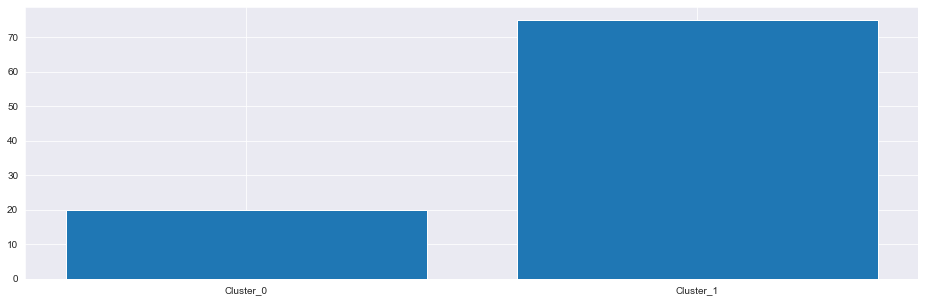

In [52]:
# Objects distribution in clusters
labels = [f'Cluster_{i}' for i in range(len(ts_clustered))]
samples_in_cluster = [val.shape[0] for val in ts_clustered]

plt.figure(figsize=(16,5))
plt.bar(labels, samples_in_cluster);

==========Cluster number: 0==========


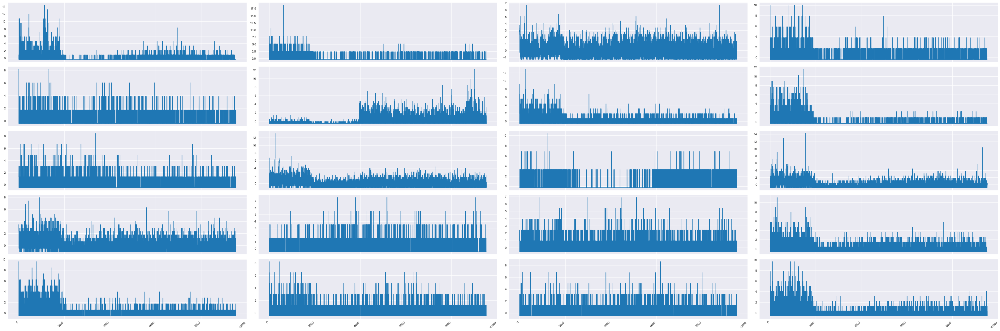

==========Cluster number: 1==========


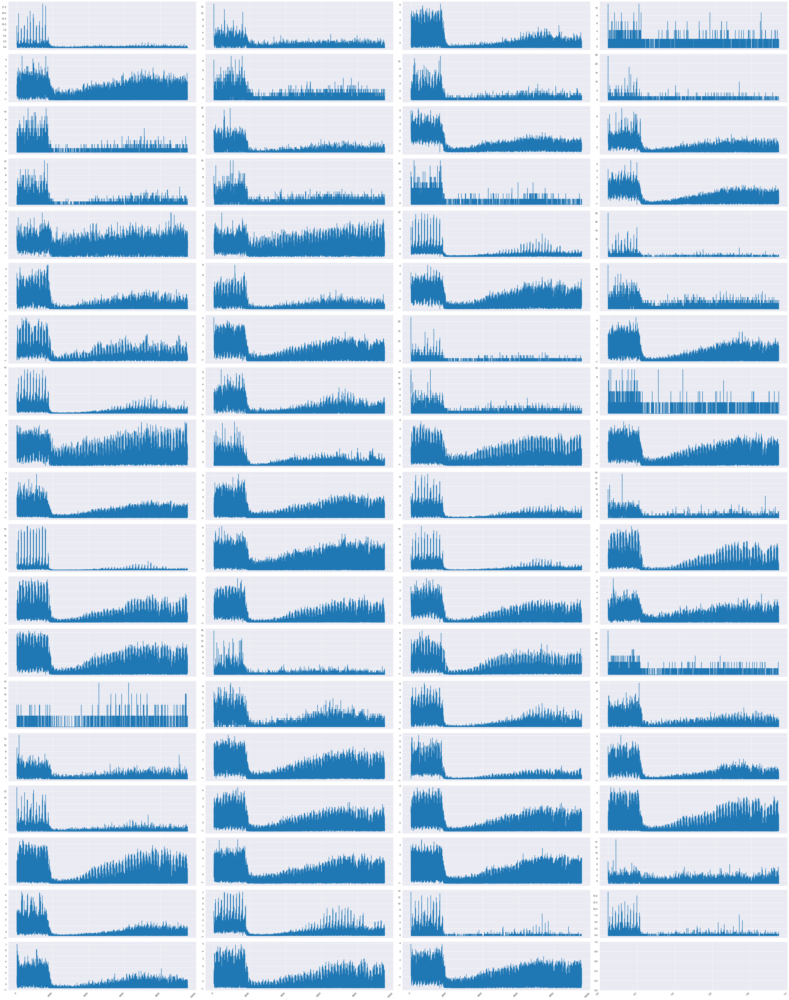

In [53]:
for cluster in range(len(ts_clustered)):
    print(f"==========Cluster number: {cluster}==========")
    plot_cluster_ts(ts_clustered[cluster])

### Variational Recurrent Auto-encoders (VRAE)
In this approach, we will train NN (Recurrent Auto-encoders with LSTM / GRU blocks) and get compressed vector representations of series (embeddings)

Trying to train the encoder and decoder in such a way that in all the variety of data at the input they would receive series close to each other, and those that differ were separated, according to the distance that we choose.

The algorithm is trained in unsupervised mode

In [1]:
from git_packages.timeseries_clustering_vae.vrae.vrae import VRAE
from git_packages.timeseries_clustering_vae.vrae.utils import *

import torch
import plotly
from torch.utils.data import DataLoader, TensorDataset
plotly.offline.init_notebook_mode()

In [119]:
vrae_df = scaled_ts.copy()

dload = '/content/timeseries_clustering_vae/' 

In [120]:
# Model parameters
hidden_size = 50
hidden_layer_depth = 1
latent_length = 20
batch_size = 5
learning_rate = 0.005
n_epochs = 40
dropout_rate = 0.1
optimizer = 'Adam' # Adam/SGD
cuda = True # Train on GPU
print_every=30
clip = True 
max_grad_norm=5
loss = 'MSELoss' # SmoothL1Loss/MSELoss
block = 'LSTM' # LSTM/GRU

In [121]:
# # Define the function of data preparation for the network
# def prepare_data(ts_df, ratio_train=0.9):
#     """Input:
#     direc: location of the UCR archive
#     ratio_train: ratio to split training and testset
#     dataset: name of the dataset in the UCR archive"""

#     data = ts_df
#     # data = np.concatenate((data_train, data_test_val), axis=0)
#     data = np.expand_dims(data, -1) # создали 3D тензор
    

#     N, D, _ = data.shape

#     ind_cut = int(ratio_train * N)
#     ind = np.random.permutation(N)
#     return data[ind[:ind_cut], :, :], data[ind[ind_cut:], :, :], np.zeros(shape=(ind_cut,1)), np.zeros(shape=(N-ind_cut,1))

In [122]:
# Because we don't use test_df, then we will create a training DF on the entire set of series
X_train = np.expand_dims(scaled_ts, -1)
train_dataset = TensorDataset(torch.from_numpy(X_train))

sequence_length = X_train.shape[1] # n observaions in a series 
number_of_features = X_train.shape[2] 

In [123]:
# Model initialization 
vrae = VRAE(sequence_length=sequence_length,
            number_of_features = number_of_features,
            hidden_size = hidden_size, 
            hidden_layer_depth = hidden_layer_depth,
            latent_length = latent_length,
            batch_size = batch_size,
            learning_rate = learning_rate,
            n_epochs = n_epochs,
            dropout_rate = dropout_rate,
            optimizer = optimizer, 
            cuda = cuda,
            print_every=print_every, 
            clip=clip, 
            max_grad_norm=max_grad_norm,
            loss = loss,
            block = block,
            dload = dload)

In [124]:
%%time 

# Train
vrae.fit(train_dataset)

Epoch: 0
Average loss: 50364.9622
Epoch: 1
Average loss: 50032.8828
Epoch: 2
Average loss: 64501.2819
Epoch: 3
Average loss: 50695.7467
Epoch: 4
Average loss: 50100.3967
Epoch: 5
Average loss: 50008.3811
Epoch: 6
Average loss: 60144.4976
Epoch: 7
Average loss: 50014.2064
Epoch: 8
Average loss: 84675.9347
Epoch: 9
Average loss: 50168.2031
Epoch: 10
Average loss: 50011.8882
Epoch: 11
Average loss: 54349.7381
Epoch: 12
Average loss: 50013.6934
Epoch: 13
Average loss: 52699.4931
Epoch: 14
Average loss: 50207.1766
Epoch: 15
Average loss: 50041.4865
Epoch: 16
Average loss: 57990.8707
Epoch: 17
Average loss: 44467.7780
Epoch: 18
Average loss: 41818.6734
Epoch: 19
Average loss: 41110.1554
Epoch: 20
Average loss: 40355.4416
Epoch: 21
Average loss: 40188.9580
Epoch: 22
Average loss: 39896.2337
Epoch: 23
Average loss: 40063.1000
Epoch: 24
Average loss: 39817.6612
Epoch: 25
Average loss: 39731.0378
Epoch: 26
Average loss: 39926.3477
Epoch: 27
Average loss: 39616.9618
Epoch: 28
Average loss: 40064.

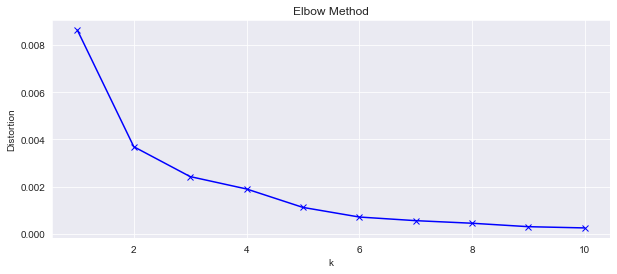

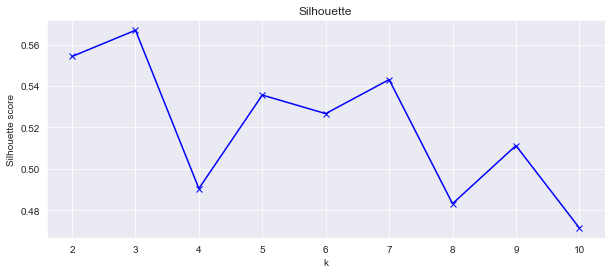

In [125]:
# Get a vector representation
embeddings = vrae.transform(train_dataset)

# Cluster Time Series Embeddings 
get_kmeans_results(data=embeddings, max_clusters=10, metric='euclidean', seed=SEED)

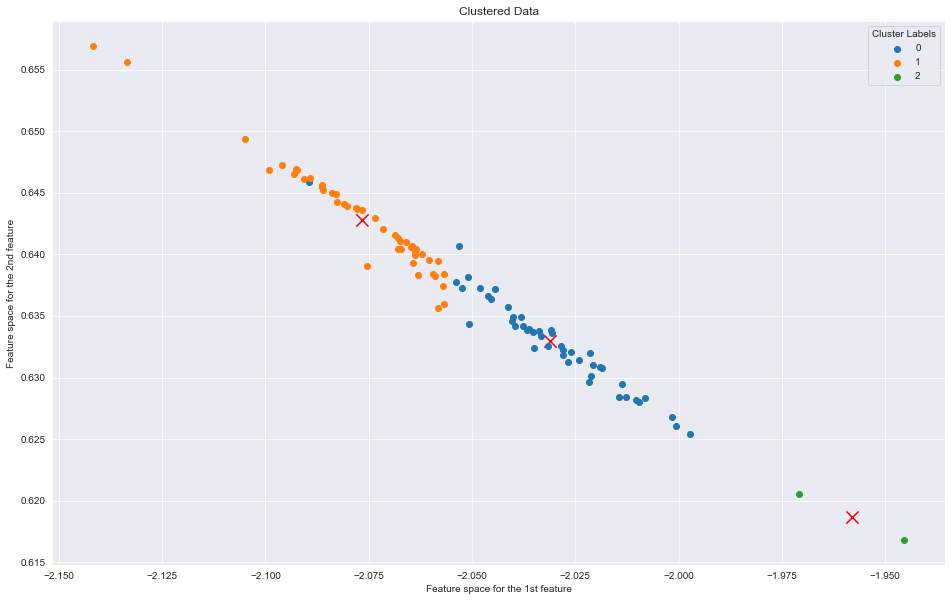

In [135]:
model = TimeSeriesKMeans(n_clusters=3, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

# Взглянем на полученные кластеры кластеров 
plot_clusters(data=embeddings,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

The metric shows good results, but some clusters overlap

In [136]:
kmeans_model = TimeSeriesKMeans(n_clusters=3, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)
cluster_labels = kmeans_model.fit_predict(embeddings)

ts_clustered = [ scaled_ts[(cluster_labels == lable), :] for lable in np.unique(cluster_labels)]

==========Cluster number: 0==========


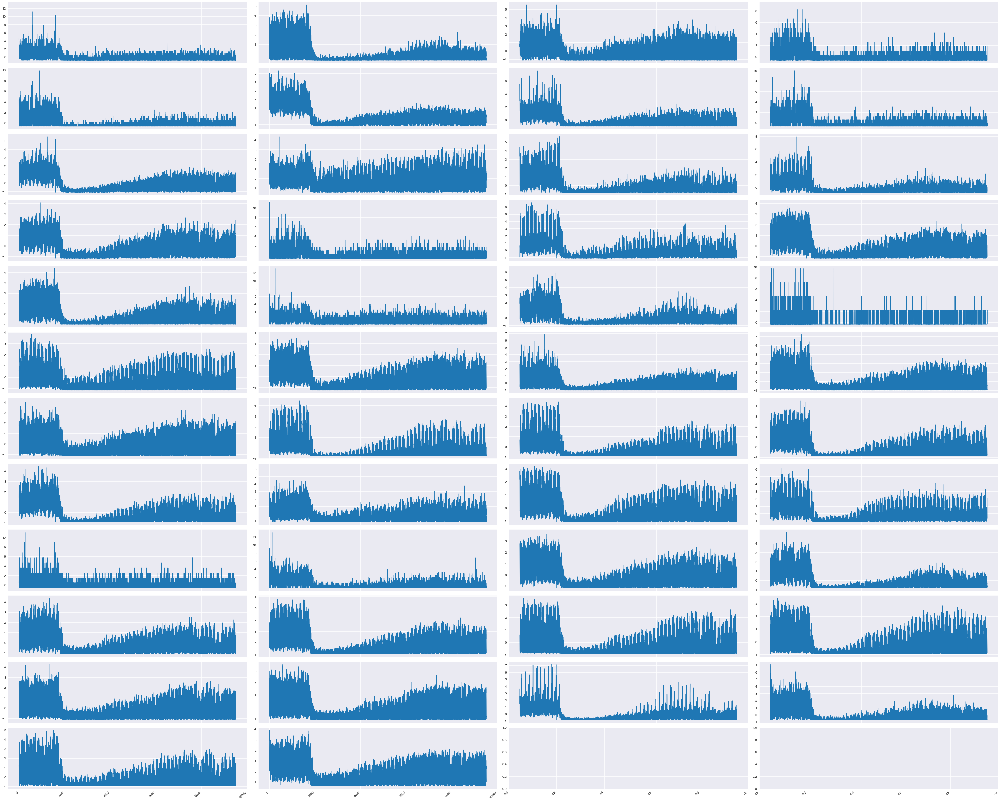

==========Cluster number: 1==========


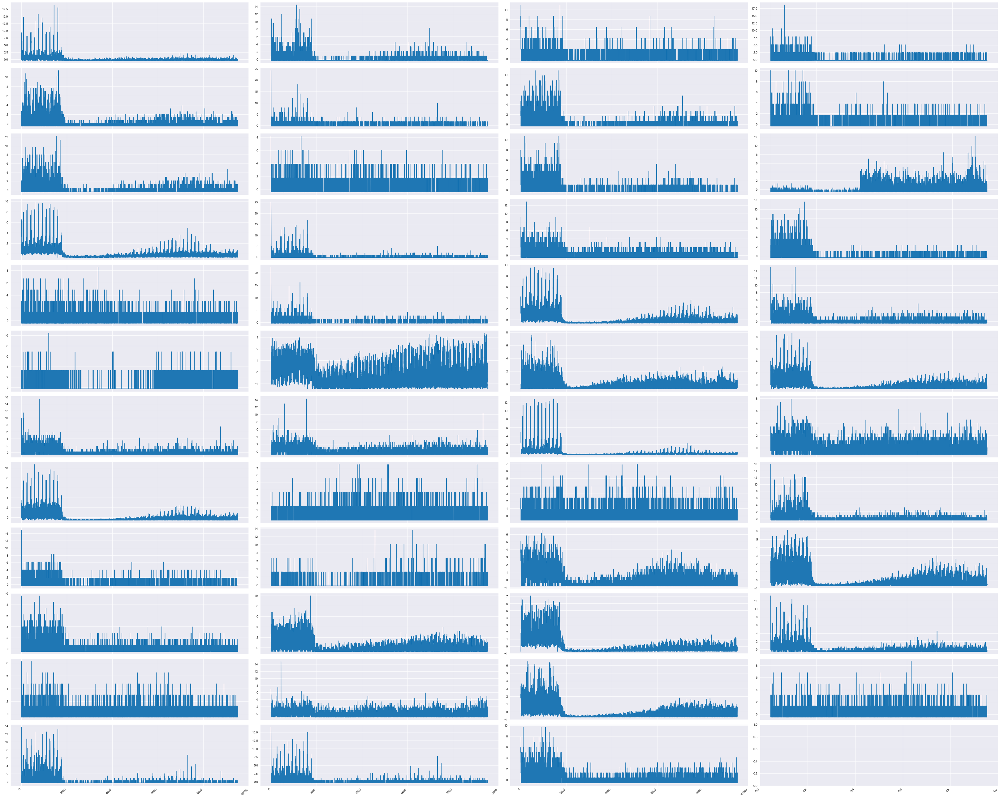

==========Cluster number: 2==========


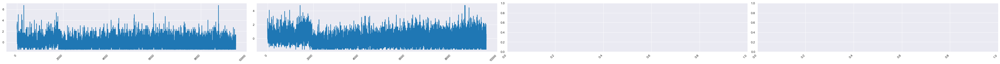

In [137]:
for cluster in range(len(ts_clustered)):
    print(f"==========Cluster number: {cluster}==========")
    plot_cluster_ts(ts_clustered[cluster])

The main increase in the quality of clustering was demonstrated by dimensionality reduction methods (they fight well with the curse of dimensionality)

**As the main solution, we will choose KMeans clustering based on t-SNE features**